<a href="https://colab.research.google.com/github/I-Behdar/Bank_Transactions-EDA-Clustering/blob/main/Bank_Transactions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Data Download**

In [1]:
! kaggle datasets download valakhorasani/bank-transaction-dataset-for-fraud-detection

Dataset URL: https://www.kaggle.com/datasets/valakhorasani/bank-transaction-dataset-for-fraud-detection
License(s): apache-2.0
100% 102k/102k [00:00<00:00, 518kB/s]
100% 102k/102k [00:00<00:00, 517kB/s]


In [2]:
! unzip /content/bank-transaction-dataset-for-fraud-detection.zip

Archive:  /content/bank-transaction-dataset-for-fraud-detection.zip
  inflating: bank_transactions_data_2.csv  


# **Data Initialization**

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings('ignore')

The dataset contains detailed records of banking transactions, with 16 columns and 2,512 entries. Each record includes information such as the transaction amount, type, date, and duration, along with customer details like age, occupation, and account balance. Additional data points, such as the transaction channel, location, and device/IP information, provide rich contextual insights.

This dataset is well-suited for clustering projects as it allows for the analysis of customer behavior, transaction patterns, and fraud detection. By clustering based on features such as transaction amounts, durations, and customer demographics, we can identify patterns like customer segmentation, frequently used channels, or suspicious activities. With some preprocessing and feature engineering, this dataset has the potential for valuable insights in banking analytics and customer relationship management.

In [4]:
data = pd.read_csv('/content/bank_transactions_data_2.csv')
df = pd.DataFrame(data)
df

,TransactionID,AccountID,TransactionAmount,TransactionDate,TransactionType,Location,DeviceID,IP Address,MerchantID,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance,PreviousTransactionDate
0,TX000001,AC00128,14.09,2023-04-11 16:29:14,Debit,San Diego,D000380,162.198.218.92,M015,ATM,70,Doctor,81,1,5112.21,2024-11-04 08:08:08
1,TX000002,AC00455,376.24,2023-06-27 16:44:19,Debit,Houston,D000051,13.149.61.4,M052,ATM,68,Doctor,141,1,13758.91,2024-11-04 08:09:35
2,TX000003,AC00019,126.29,2023-07-10 18:16:08,Debit,Mesa,D000235,215.97.143.157,M009,Online,19,Student,56,1,1122.35,2024-11-04 08:07:04
3,TX000004,AC00070,184.50,2023-05-05 16:32:11,Debit,Raleigh,D000187,200.13.225.150,M002,Online,26,Student,25,1,8569.06,2024-11-04 08:09:06
4,TX000005,AC00411,13.45,2023-10-16 17:51:24,Credit,Atlanta,D000308,65.164.3.100,M091,Online,26,Student,198,1,7429.40,2024-11-04 08:06:39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2507,TX002508,AC00297,856.21,2023-04-26 17:09:36,Credit,Colorado Springs,D000625,21.157.41.17,M072,Branch,33,Doctor,109,1,12690.79,2024-11-04 08:11:29
2508,TX002509,AC00322,251.54,2023-03-22 17:36:48,Debit,Tucson,D000410,49.174.157.140,M029,Branch,48,Doctor,177,1,254.75,2024-11-04 08:11:42
2509,TX002510,AC00095,28.63,2023-08-21 17:08:50,Debit,San Diego,D000095,58.1.27.124,M087,Branch,56,Retired,146,1,3382.91,2024-11-04 08:08:39
2510,TX002511,AC00118,185.97,2023-02-24 16:24:46,Debit,Denver,D000634,21.190.11.223,M041,Online,23,Student,19,1,1776.91,2024-11-04 08:12:22


In [5]:
df['AccountID'].unique().shape

(495,)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2512 entries, 0 to 2511
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   TransactionID            2512 non-null   object 
 1   AccountID                2512 non-null   object 
 2   TransactionAmount        2512 non-null   float64
 3   TransactionDate          2512 non-null   object 
 4   TransactionType          2512 non-null   object 
 5   Location                 2512 non-null   object 
 6   DeviceID                 2512 non-null   object 
 7   IP Address               2512 non-null   object 
 8   MerchantID               2512 non-null   object 
 9   Channel                  2512 non-null   object 
 10  CustomerAge              2512 non-null   int64  
 11  CustomerOccupation       2512 non-null   object 
 12  TransactionDuration      2512 non-null   int64  
 13  LoginAttempts            2512 non-null   int64  
 14  AccountBalance          

In [7]:
df.describe()

,TransactionAmount,CustomerAge,TransactionDuration,LoginAttempts,AccountBalance
count,2512.000000,2512.000000,2512.000000,2512.000000,2512.000000
mean,297.593778,44.673965,119.643312,1.124602,5114.302966
std,291.946243,17.792198,69.963757,0.602662,3900.942499
min,0.260000,18.000000,10.000000,1.000000,101.250000
25%,81.885000,27.000000,63.000000,1.000000,1504.370000
50%,211.140000,45.000000,112.500000,1.000000,4735.510000
75%,414.527500,59.000000,161.000000,1.000000,7678.820000
max,1919.110000,80.000000,300.000000,5.000000,14977.990000


# **Data Cleaning**

This cell imports the necessary libraries for preprocessing:
- `OneHotEncoder` and `LabelEncoder` from `sklearn` for encoding categorical data.
- `pandas` for data manipulation.


In [8]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

A copy of the original dataset is created to preserve the raw data. Irrelevant columns for clustering are removed:
- `TransactionID`: A unique identifier that doesn't contribute to clustering.
- `IP Address`: Unused for clustering as it doesn't carry meaningful clustering information.
- `MerchantID`: Removed due to limited utility in clustering directly.


In [9]:
df_numeric = df.copy()

In [10]:
df_numeric.drop(['TransactionID', 'IP Address', 'MerchantID'], axis=1, inplace=True)

Date and time-related features are extracted from `TransactionDate` and `PreviousTransactionDate`:
- Convert both columns to `datetime` for easier manipulation.
- `TransactionHour`: Extracts the hour of the transaction.
- `TransactionDayOfWeek`: Identifies the day of the week the transaction occurred.
- `TimeSinceLastTransaction`: Calculates the time difference (in hours) between the last and current transactions.


In [11]:
df_numeric['TransactionDate'] = pd.to_datetime(df_numeric['TransactionDate'])
df_numeric['PreviousTransactionDate'] = pd.to_datetime(df_numeric['PreviousTransactionDate'])

df_numeric['TransactionHour'] = df_numeric['TransactionDate'].dt.hour
df_numeric['TransactionDayOfWeek'] = df_numeric['TransactionDate'].dt.dayofweek
df_numeric['TimeSinceLastTransaction'] = (
    (df_numeric['PreviousTransactionDate'] - df_numeric['TransactionDate']).dt.total_seconds() / 3600
)

The original datetime columns (`TransactionDate` and `PreviousTransactionDate`) are dropped after extracting relevant features, as they are no longer needed for clustering.


In [12]:
df_numeric.drop(['TransactionDate', 'PreviousTransactionDate'], axis=1, inplace=True)

Identifies columns with categorical data:
- `TransactionType`, `Channel`, and `CustomerOccupation` are one-hot encoded to avoid introducing ordinal relationships.
- Remaining categorical columns (`AccountID`, `Location`, `DeviceID`) are label-encoded for simplicity.


In [13]:
categorical_cols = ['AccountID', 'TransactionType', 'Location', 'DeviceID', 'Channel', 'CustomerOccupation']

One-hot encoding is applied to `TransactionType`, `Channel`, and `CustomerOccupation`:
- Converts these categorical variables into binary features for better representation in clustering.
- Drops the original columns after encoding.


In [14]:
one_hot_cols = ['TransactionType', 'Channel', 'CustomerOccupation']
encoder = OneHotEncoder(sparse_output=False, drop='first')
one_hot_encoded = pd.DataFrame(
    encoder.fit_transform(df_numeric[one_hot_cols]),
    columns=encoder.get_feature_names_out(one_hot_cols),
    index=df_numeric.index
)

The remaining categorical columns (`AccountID`, `Location`, `DeviceID`) are label-encoded:
- Assigns a unique integer to each category in these columns.
- Useful for reducing dimensionality while retaining category distinctions.


In [15]:
df_numeric = pd.concat([df_numeric, one_hot_encoded], axis=1)
df_numeric.drop(one_hot_cols, axis=1, inplace=True)

In [16]:
label_cols = ['AccountID', 'Location', 'DeviceID']
label_encoder = LabelEncoder()
for col in label_cols:
    df_numeric[col] = label_encoder.fit_transform(df_numeric[col])

Handles missing values in `TimeSinceLastTransaction`:
- Replaces `NaN` values with the median of the column to ensure no missing data before clustering.


In [17]:
df_numeric['TimeSinceLastTransaction'].fillna(df_numeric['TimeSinceLastTransaction'].median(), inplace=True)

In [18]:
df_numeric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2512 entries, 0 to 2511
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AccountID                    2512 non-null   int64  
 1   TransactionAmount            2512 non-null   float64
 2   Location                     2512 non-null   int64  
 3   DeviceID                     2512 non-null   int64  
 4   CustomerAge                  2512 non-null   int64  
 5   TransactionDuration          2512 non-null   int64  
 6   LoginAttempts                2512 non-null   int64  
 7   AccountBalance               2512 non-null   float64
 8   TransactionHour              2512 non-null   int32  
 9   TransactionDayOfWeek         2512 non-null   int32  
 10  TimeSinceLastTransaction     2512 non-null   float64
 11  TransactionType_Debit        2512 non-null   float64
 12  Channel_Branch               2512 non-null   float64
 13  Channel_Online    

In [19]:
df_numeric.head()

,AccountID,TransactionAmount,Location,DeviceID,CustomerAge,TransactionDuration,LoginAttempts,AccountBalance,TransactionHour,TransactionDayOfWeek,TimeSinceLastTransaction,TransactionType_Debit,Channel_Branch,Channel_Online,CustomerOccupation_Engineer,CustomerOccupation_Retired,CustomerOccupation_Student
0,126,14.09,36,365,70,81,1,5112.21,16,1,13743.648333,1.0,0.0,0.0,0.0,0.0,0.0
1,450,376.24,15,50,68,141,1,13758.91,16,1,11895.421111,1.0,0.0,0.0,0.0,0.0,0.0
2,18,126.29,23,229,19,56,1,1122.35,18,0,11581.848889,1.0,0.0,1.0,0.0,0.0,1.0
3,68,184.50,33,182,26,25,1,8569.06,16,4,13167.615278,1.0,0.0,1.0,0.0,0.0,1.0
4,406,13.45,1,298,26,198,1,7429.40,17,0,9230.254167,0.0,0.0,1.0,0.0,0.0,1.0


In [20]:
df_numeric.to_csv('bank_transaction_numeric.csv')

# **Exploratory Data Analysis**

## Visualization (PairPlot)

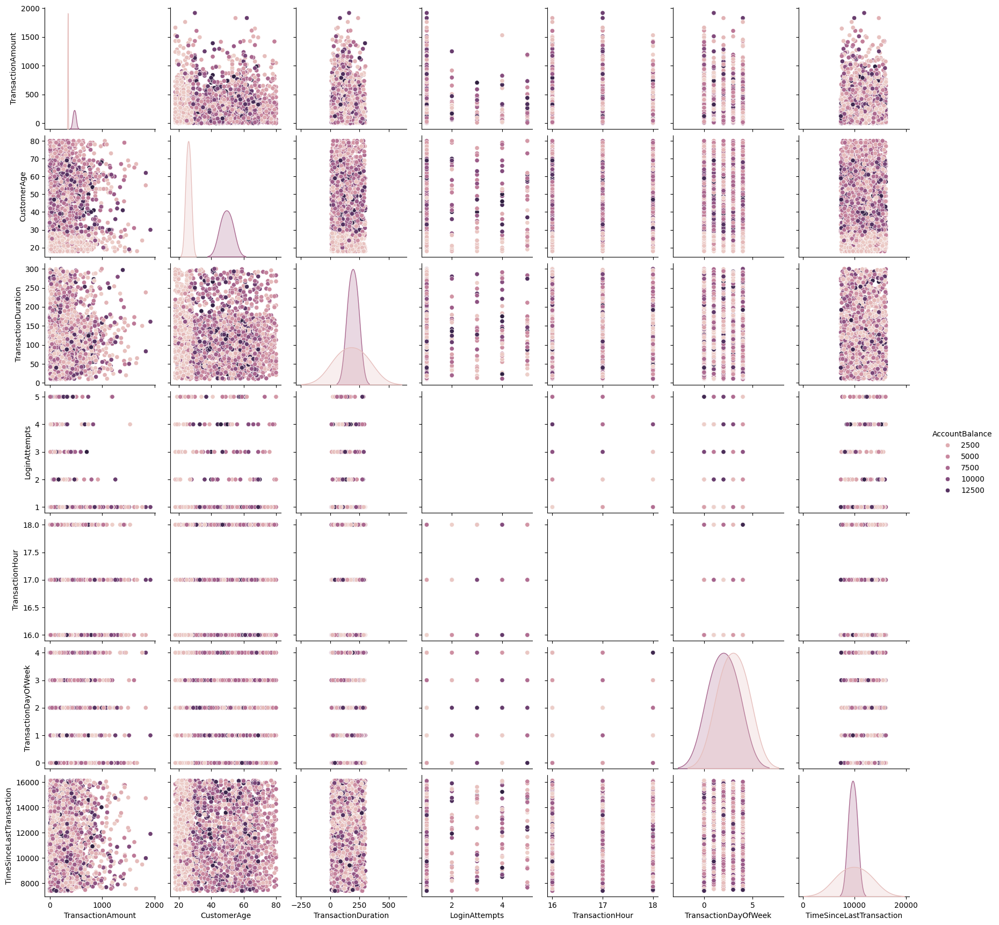

In [ ]:
sns.pairplot(df_numeric, hue='AccountBalance')
plt.savefig('initial_pairplot.png')
plt.show()

The pairplot of the dataset reveals several important patterns and insights. TransactionAmount exhibits a right-skewed distribution, with most transactions occurring at lower amounts, though a few large transactions stand out as potential outliers. CustomerAge is relatively uniformly distributed, with younger customers being slightly more frequent, and there is a weak positive relationship between age and both TransactionAmount and AccountBalance, suggesting that older customers may transact more and have higher balances. TransactionDuration is concentrated at lower values, showing limited correlation with other features, while LoginAttempts is highly uniform, indicating limited variation and potentially low significance for clustering. TransactionHour highlights peaks around specific hours (16-18), suggesting busy transaction periods, while TransactionDayOfWeek is fairly evenly distributed, with minor variations. The TimeSinceLastTransaction feature is heavily skewed towards higher values, indicating that most transactions occur after long intervals, though its relationship with other features like TransactionAmount is weak. Finally, AccountBalance shows a wide range of values, with a concentration in the lower ranges and a moderate positive correlation with TransactionAmount. These observations suggest the need for preprocessing steps such as scaling, outlier handling, and possibly feature engineering (e.g., interaction terms or dimensionality reduction) to enhance clustering performance

## Visualization (Distribution Plot)

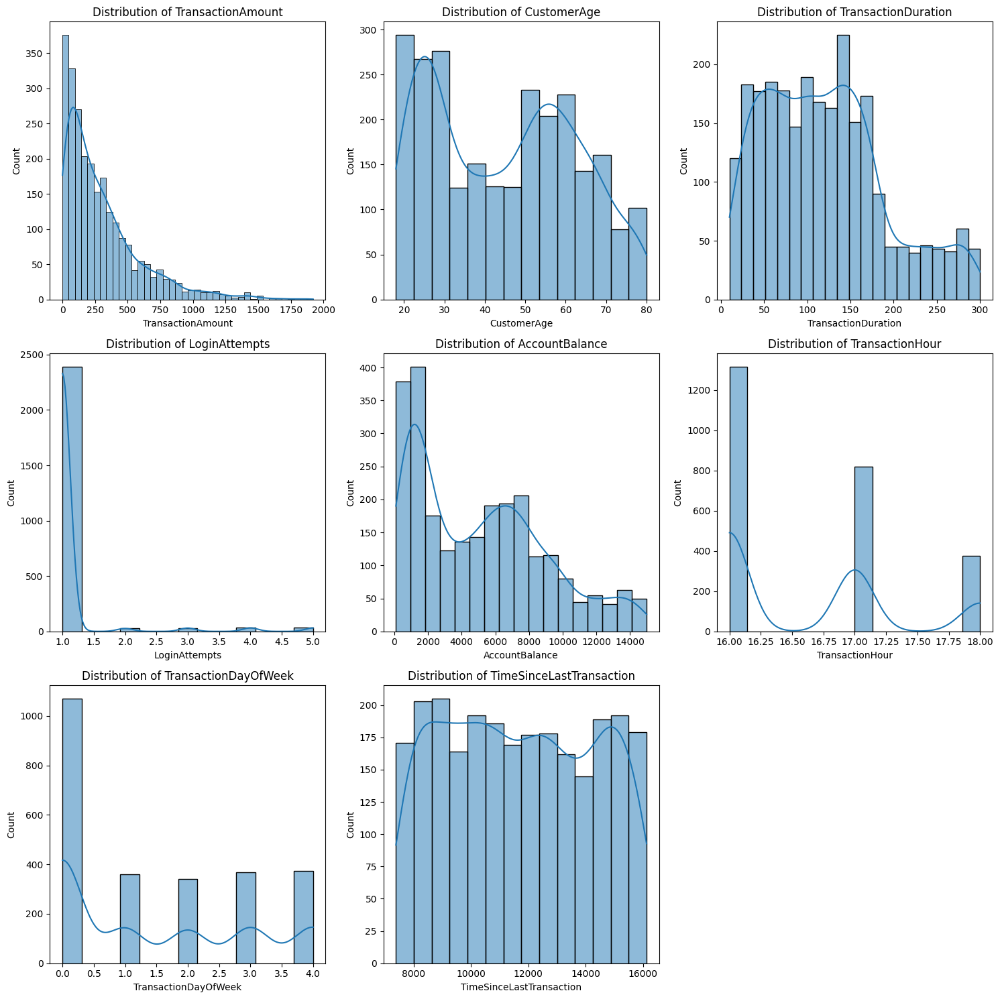

In [ ]:
numeric_columns = df_numeric.select_dtypes(include=['number']).columns

n_cols = 3
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.histplot(df_numeric[column], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')

if len(numeric_columns) < len(axes):
    for j in range(len(numeric_columns), len(axes)):
        axes[j].set_visible(False)


plt.tight_layout()
plt.savefig('numeric_columns_distribution.png')
plt.show()

The distribution plots provide valuable insights into the dataset. TransactionAmount is heavily right-skewed, with most transactions being small and a few high-value outliers that may need capping or normalization. CustomerAge shows a bimodal distribution, suggesting distinct customer groups around the ages of 20-30 and 60-70, which could be useful for segmentation. TransactionDuration exhibits a relatively uniform spread, indicating varied transaction times, while LoginAttempts is sharply peaked at 1, showing little variability and potentially limited importance for clustering. AccountBalance is right-skewed, with most balances in lower ranges and some high-value outliers that could distort clustering results if not scaled. TransactionHour has clear peaks at 16:00, 17:00, and 18:00, highlighting high transaction activity during these times. In contrast, TransactionDayOfWeek is fairly uniform across weekdays, indicating minimal influence of day on transaction behavior. Finally, TimeSinceLastTransaction appears multimodal, revealing behavioral patterns of frequent versus infrequent transactors, which could contribute significantly to clustering. These observations suggest the need for scaling, outlier handling, and potential feature engineering to enhance clustering results.

## Visualization (Box Plot)

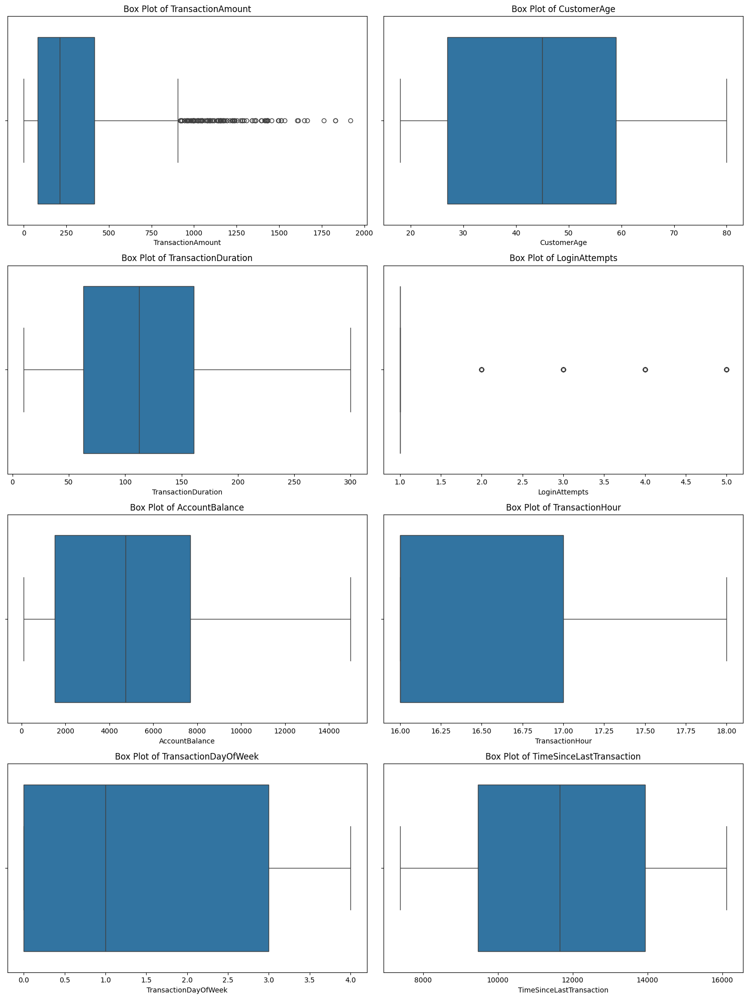

In [ ]:
n_cols = 2
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.boxplot(x=df_numeric[column], ax=axes[i])
    axes[i].set_title(f'Box Plot of {column}')

if len(numeric_columns) < len(axes):
    for j in range(len(numeric_columns), len(axes)):
        axes[j].set_visible(False)

plt.tight_layout()
plt.savefig('numeric_columns_boxplots.png')
plt.show()

The box plots reveal several important aspects of the dataset. TransactionAmount shows a significant number of outliers above the upper whisker, indicating high-value transactions that may need to be capped or transformed for better clustering. CustomerAge is well-distributed with no extreme outliers, spanning a consistent range from 20 to 80, making it a stable feature for clustering. TransactionDuration has no noticeable outliers and is evenly distributed, suggesting it is a well-behaved feature. In contrast, LoginAttempts shows limited variability, with a concentration at the lower end and a few outliers, which may need special attention. AccountBalance spans a wide range but does not exhibit prominent outliers, although scaling is essential due to its large values. TransactionHour is tightly distributed around specific times with no outliers, reflecting transaction peaks during specific hours. TransactionDayOfWeek is uniformly distributed across the weekday range with no outliers, suggesting minimal influence of the day on clustering. Finally, TimeSinceLastTransaction is well-distributed with no significant outliers, though its wide range requires scaling for clustering. Overall, preprocessing steps such as outlier handling, scaling, and assessing low-variability features like LoginAttempts are recommended for optimal clustering performance.

## Correlation Matrix

In [ ]:
corr = df_numeric.corr()

In [ ]:
mask = np.triu(np.ones_like(corr, dtype=bool))

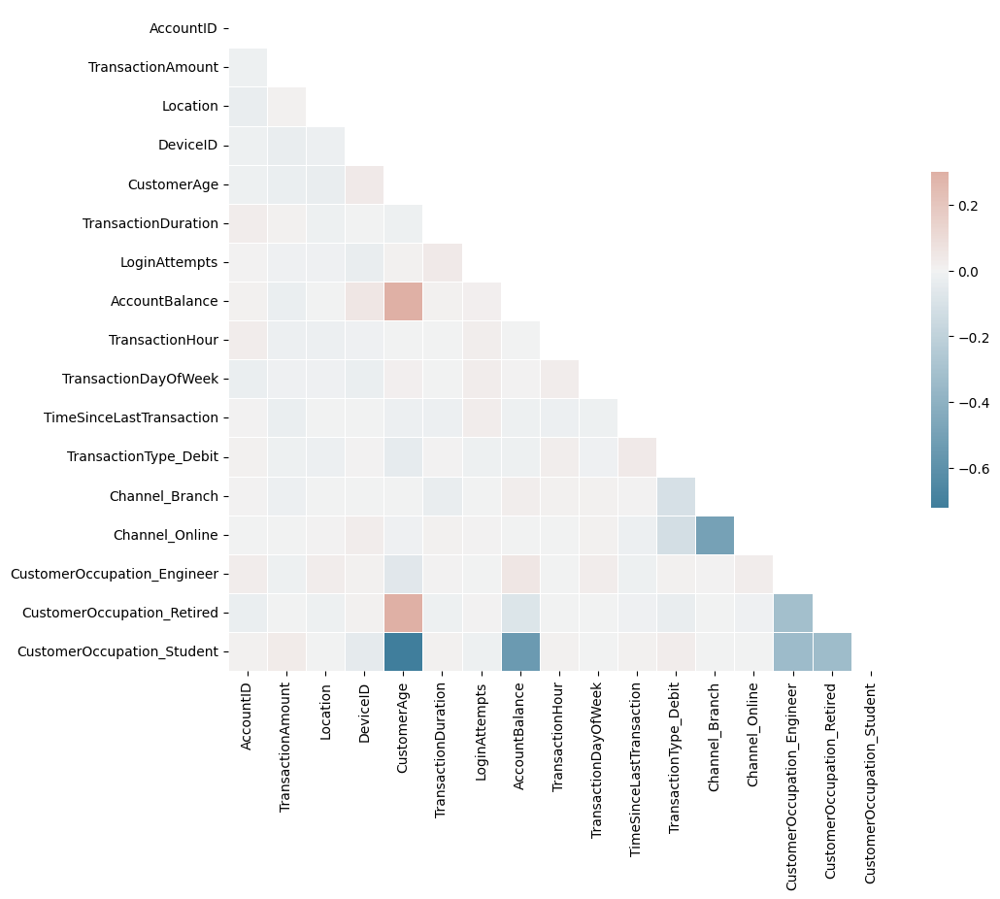

In [ ]:
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

The correlation matrix reveals several key insights about the relationships between the features in the dataset. Most features exhibit low or no correlation with one another, indicating that the dataset is composed of largely independent features, which is advantageous for clustering as it ensures feature diversity. AccountBalance shows a moderate positive correlation with TransactionAmount, suggesting that customers with higher balances tend to make higher-value transactions, and a weak positive correlation with CustomerAge, indicating that older customers may have slightly higher balances. CustomerOccupation_Student is negatively correlated with CustomerAge, as expected, since students are generally younger. TransactionType_Debit has a slight negative correlation with AccountBalance, suggesting that debit transactions are more common among customers with lower balances. Features like LoginAttempts and TransactionDuration have very weak or no correlations with other features, which may limit their impact on clustering. Similarly, TimeSinceLastTransaction operates independently with no strong correlations, offering unique clustering potential. The encoded features for transaction channels (e.g., Channel_Online and Channel_Branch) show no significant relationships with numerical features, indicating that channel choice is independent of factors like age or transaction value. These observations highlight the need for scaling to ensure balance across features and suggest that independent features like AccountBalance, TransactionAmount, and CustomerAge are likely to be more influential in clustering.

## Exploratory Data Analysis Insight



### Continuous Features:
- **TransactionAmount**: Skewed distribution with many small transactions and outliers for higher amounts.
- **AccountBalance**: Bimodal distribution with two major clusters.
- **TimeSinceLastTransaction**: Uniformly distributed, reflecting varied transaction frequencies.
- **TransactionDuration**: Multimodal distribution with significant variability.

### Discrete Features:
- **CustomerAge**: Bimodal distribution, separating younger and older customers.
- **LoginAttempts**: Minimal variation, mostly concentrated at 1.
- **TransactionHour** and **TransactionDayOfWeek**: Evenly distributed, showing no strong time-based trends.

### Correlation Analysis:
- Features are mostly uncorrelated, ensuring diversity for clustering.
- Moderate correlations exist between **CustomerOccupation** categories and **CustomerAge**, aligning with expected demographic patterns.

### Observations:
- **Outliers**: Visible in **TransactionAmount**, requiring capping or transformation.
- **Scaling**: Required for continuous features to balance their impact on clustering.
- **Feature Independence**: Low correlation between features supports diverse and unbiased clustering.

# **Data Preprocessing**

This cell imports the required libraries:
- `StandardScaler` from `sklearn.preprocessing` for scaling continuous features.


In [21]:
from sklearn.preprocessing import StandardScaler

## Standardization of Numerical Features
The `StandardScaler` is initialized to standardize continuous features by removing the mean and scaling to unit variance. This ensures that features are on the same scale, preventing features with larger ranges from dominating the clustering process.

The continuous features `["TransactionAmount", "AccountBalance", "TimeSinceLastTransaction", "TransactionDuration"]` are scaled using the `StandardScaler`. This step standardizes each feature:
- Removes the mean (centers the data at 0).
- Scales the data to have unit variance.

This helps to balance the influence of features with varying ranges and distributions.


In [22]:
scaler = StandardScaler()

df_numeric_scaled = df_numeric.copy()
continuous_features = ["TransactionAmount", "AccountBalance", "TimeSinceLastTransaction", "TransactionDuration"]

df_numeric_scaled[continuous_features] = scaler.fit_transform(df_numeric_scaled[continuous_features])

## Outlier Detection and Removal
The `TransactionAmount` feature is clipped to a range of -3 to 3 standard deviations. This step caps extreme outliers, preventing them from disproportionately influencing the clustering process. Values outside this range are replaced with the closest limit (-3 or 3).


In [23]:
df_numeric_scaled["TransactionAmount"] = np.clip(df_numeric_scaled["TransactionAmount"], -3, 3)

In [24]:
df_numeric_scaled.to_csv('bank_transaction_numeric_scaled.csv')

# **Clustering**



This analysis aims to uncover patterns and group similarities within the data by applying clustering techniques to the `AccountID` and `TransactionAmount` columns.

- **Algorithms Applied**
    - `KMeans`
    - `K-Medoid`
    - `DBSCAN`
    - `Mean Shift`
    - `Hierarchical Clustering`
    - `Fuzzy C-Means`

- **Workflow**
    - Extract the `AccountID` and `TransactionAmount` columns for clustering.
    - Apply each clustering algorithm to the dataset.
    - Visualize clustering results for each method.
    - Analyze and compare the clustering outputs to identify meaningful patterns.

- **Tools Used**  
    - `sklearn`, `scikit-fuzzy`, `scikit-learn-extra`, `matplotlib`, `seaborn`, `pandas`, and `numpy`
    - Algorithms implemented with hyperparameter tuning to enhance clustering accuracy.

- **Goal**
    - Identify similarities and relationships between `AccountID` and `TransactionAmount` to derive actionable insights from the data.

## KMeans

KMeans is an unsupervised machine learning algorithm used for clustering data points into groups (clusters).

The algorithm works as follows:

- Initialization: Randomly assigns initial cluster centers (centroids).

- Assignment: Assigns each data point to the nearest cluster center based on distance (usually Euclidean).

- Update: Recalculates the cluster centers as the mean of all points assigned to the cluster.

- Iteration: Repeats the assignment and update steps until the centroids stabilize or a maximum number of iterations is reached.


The primary objectives of KMeans are to:

Minimize inertia, which measures the sum of squared distances between data points and their nearest cluster center.
Maximize cluster separability, often evaluated using the silhouette score.

In [28]:
from sklearn.cluster import KMeans

In [29]:
inertia = []
silhouette_scores = []

for k in range(2, 15):
    kmeans = KMeans(n_clusters=k, random_state=79)
    kmeans.fit(df_numeric_scaled)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(df_numeric_scaled, kmeans.labels_))

### Elbow Method Plot
- Shows the variation in inertia with the number of clusters.
- The Elbow Method suggests that 3 clusters are a suitable choice, as the inertia decreases significantly before stabilizing.

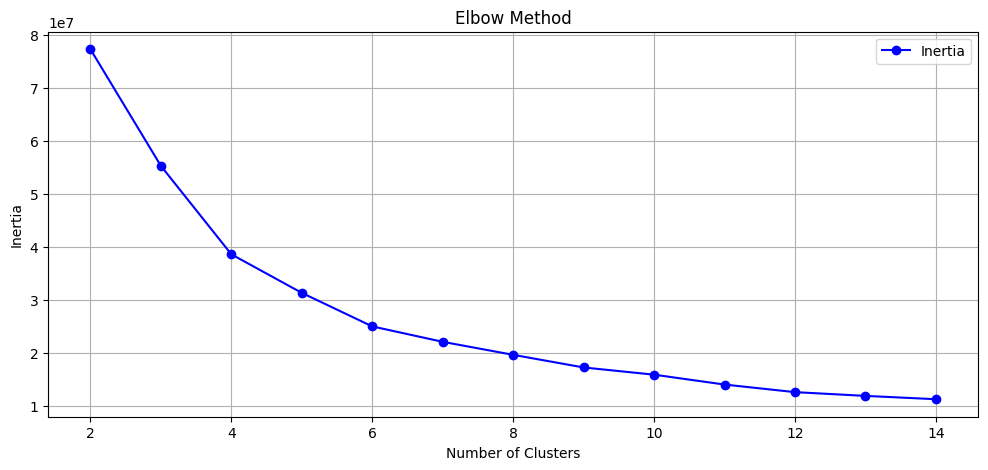

In [30]:
plt.figure(figsize=(12, 5))
plt.plot(range(2, 15), inertia, 'o-', label='Inertia', color='blue')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.legend()
plt.grid(True)
plt.show()

###Silhouette Scores Plot
Silhouette Scores plot Illustrates cluster cohesion and separation.

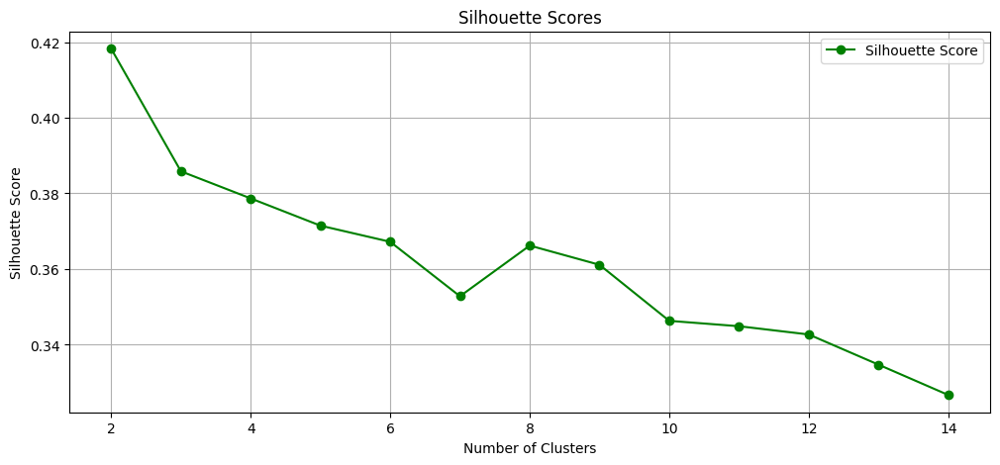

In [31]:
plt.figure(figsize=(12, 5))
plt.plot(range(2, 15), silhouette_scores, 'o-', label='Silhouette Score', color='green')
plt.title('Silhouette Scores')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.grid(True)
plt.show()

### Performance Metrics
The code uses the KMeans clustering algorithm to group the scaled numeric dataset into 3 clusters, which was determined to be the optimal number of clusters based on the Elbow Method and Silhouette Score analysis.

A KMeans model is initialized with n_clusters=3 and fit to the data, generating cluster labels (kmeans_labels) and the centroids of each cluster (kmeans_centers).

The model's performance is evaluated using two key metrics:
- inertia (sum of squared distances of samples to their nearest cluster center) - silhouette score (a measure of cluster cohesion and separation).

The inertia for the model is calculated to be `55,242,844.618`, indicating the compactness of clusters, while the silhouette score is `0.386`, reflecting moderate separation between the clusters. These results suggest that the data forms three reasonably distinct groups.

The Silhouette Score for 3 clusters is 0.386, indicating moderate cluster separation.

In [32]:
optimal_clusters = 3
kmn = KMeans(n_clusters=optimal_clusters, random_state=79)
kmeans_labels = kmn.fit_predict(df_numeric_scaled)
kmeans_centers = kmn.cluster_centers_

silhouette_score_kmn = silhouette_score(df_numeric_scaled, kmeans_labels)

print(f'The Inertia for KMeans with {optimal_clusters} Clusters is: {kmn.inertia_:.3f}')
print(f'The Silhouette Score for KMeans with {optimal_clusters} Clusters is: {silhouette_score_kmn:.3f}')

The Inertia for KMeans with 3 Clusters is: 55242844.618
The Silhouette Score for KMeans with 3 Clusters is: 0.386


### Cluster Summary

The data is grouped into three clusters: Cluster 0 with 694 samples, Cluster 1 with 1067 samples, and Cluster 2 with 751 samples. This clustering reflects the distribution and segmentation of the dataset into distinct groups.

In [33]:
cluster_sizes = np.unique(kmeans_labels, return_counts=True)
print(cluster_sizes)
for cliuster, size in zip(cluster_sizes[0], cluster_sizes[1]):
    print(f'Cluster {cliuster}: {size} samples')

(array([0, 1, 2], dtype=int32), array([ 694, 1067,  751]))
Cluster 0: 694 samples
Cluster 1: 1067 samples
Cluster 2: 751 samples


### KMeans Clustering Visualization
   - Data points are plotted based on `DeviceID` and `TransactionAmount`, with clusters clearly represented by colors.
   - Red **<font color="red">X</font>** markers indicate cluster centroids.

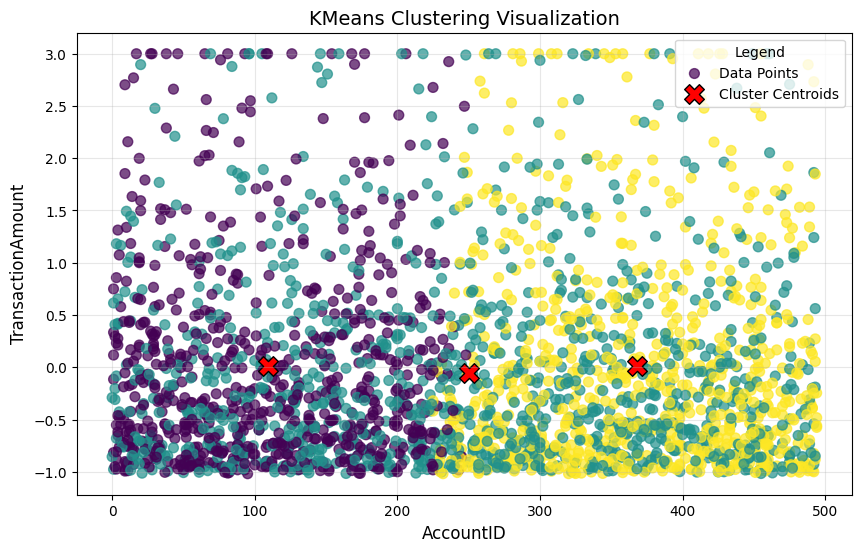

In [34]:
plt.figure(figsize=(10, 6))
plt.scatter(df_numeric_scaled.iloc[:, 0], df_numeric_scaled.iloc[:, 1], c=kmeans_labels, cmap='viridis', s=50, alpha=0.7, label='Data Points')
plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1], marker='X', s=200, c='red', label='Cluster Centroids', edgecolors='black')

plt.title('KMeans Clustering Visualization', fontsize=14)
plt.xlabel(df_numeric_scaled.columns[0], fontsize=12)
plt.ylabel(df_numeric_scaled.columns[1], fontsize=12)
plt.legend(title='Legend', fontsize=10)
plt.grid(alpha=0.3)
plt.show()

### Insights
The data is grouped into three clusters, with Cluster 0 containing 694 samples, Cluster 1 containing 1,067 samples, and Cluster 2 containing 751 samples. These clusters represent distinct groupings in the dataset based on similarities in features like DeviceID and LoginAttempts. Each cluster captures unique behavioral or operational patterns, allowing for segmentation of the data.

This clustering provides insights into relationships within the dataset, such as how DeviceID and LoginAttempts vary across different groups. These insights can be used to identify trends, optimize operations, or target specific segments for further analysis or strategic decisions.

## K-Medoid

In [35]:
! pip install scikit-learn-extra

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 28.3 MB/s eta 0:00:00


In [36]:
from sklearn_extra.cluster import KMedoids

In [37]:
inertia = []
silhouette_scores = []

for k in range(2, 15):
    kmedoids = KMedoids(n_clusters=k, random_state=79)
    kmedoids.fit(df_numeric_scaled)
    inertia.append(kmedoids.inertia_)
    silhouette_scores.append(silhouette_score(df_numeric_scaled, kmedoids.labels_))

### Elbow Method Plot
   - Shows the reduction in inertia with an increasing number of clusters, supporting the choice of 4 clusters.

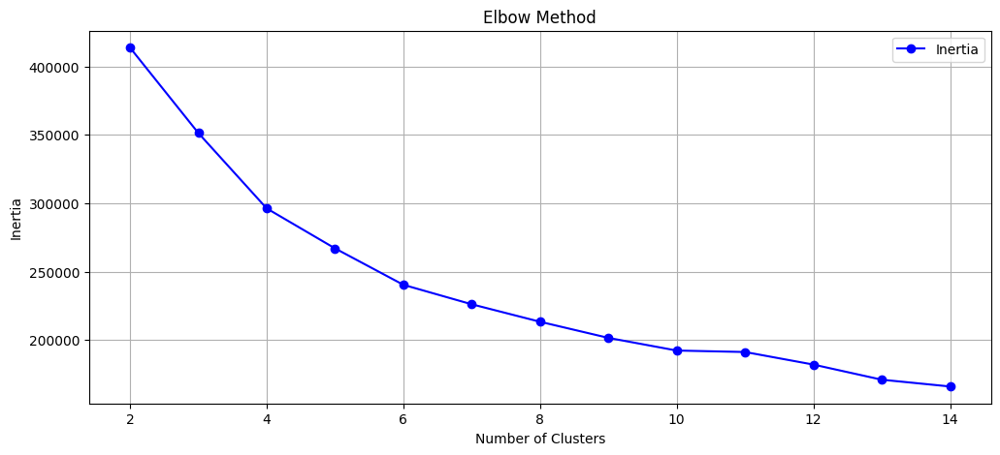

In [38]:
plt.figure(figsize=(12, 5))
plt.plot(range(2, 15), inertia, 'o-', label='Inertia', color='blue')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.legend()
plt.grid(True)
plt.show()

### Silhouette Scores Plot
   - Highlights cluster cohesion and separation, with a score of 0.377 indicating moderate cluster quality.

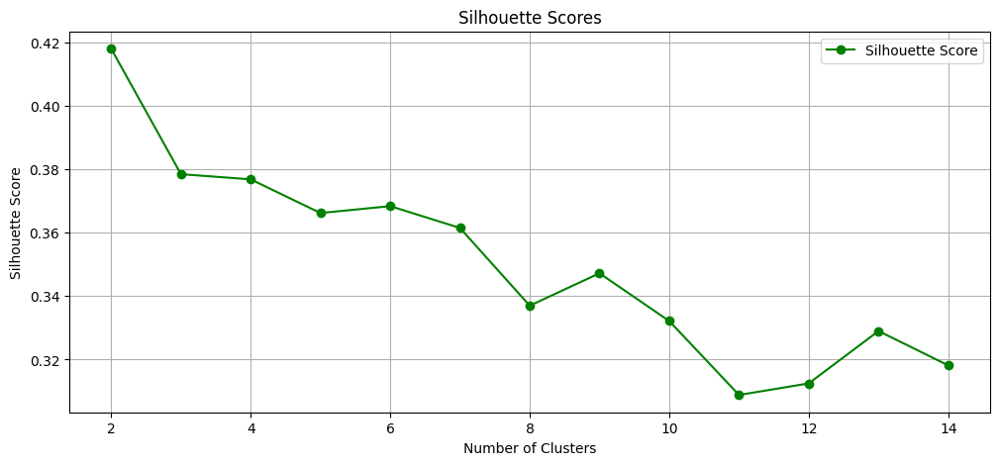

In [39]:
plt.figure(figsize=(12, 5))
plt.plot(range(2, 15), silhouette_scores, 'o-', label='Silhouette Score', color='green')
plt.title('Silhouette Scores')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.grid(True)
plt.show()

### Performance Metrics
The KMedoids algorithm is applied, to cluster the dataset into 4 clusters, as determined by the Elbow Method and Silhouette Score analysis.

The algorithm groups the data points by minimizing the sum of dissimilarities between points and their respective cluster medoids.

The performance is evaluated using two metrics:

- inertia (a measure of compactness): 296,219.307
- silhouette score (a measure of cluster separation): 0.377

For this run, inertia and silhouette score are indicating moderate clustering performance.

The inertia of 296,219.307 reflects the compactness of the clusters, with lower inertia indicating tighter clustering around medoids. While this value indicates that the clusters are well-defined, there is still room for optimization. T

he silhouette score of 0.377, measures the cohesion and separation of clusters. A score closer to 1 indicates better-defined clusters, while a moderate score like 0.377 suggests some overlap or ambiguity in cluster boundaries.

Together, these metrics demonstrate that the algorithm effectively identifies meaningful clusters, though the moderate silhouette score highlights potential for refinement.

In [40]:
optimal_clusters = 4
kmed = KMedoids(n_clusters=optimal_clusters, random_state=79)
kmedoid_labels = kmed.fit_predict(df_numeric_scaled)
kmedoid_centers = kmed.cluster_centers_

silhouette_score_kmed = silhouette_score(df_numeric_scaled, kmedoid_labels)

print(f'The Inertia for KMedoids with {optimal_clusters} Clusters is: {kmed.inertia_:.3f}')
print(f'The Silhouette Score for KMedoids with {optimal_clusters} Clusters is: {silhouette_score_kmed:.3f}')

The Inertia for KMedoids with 4 Clusters is: 296219.307
The Silhouette Score for KMedoids with 4 Clusters is: 0.377


In [41]:
cluster_sizes = np.unique(kmedoid_labels, return_counts=True)
print(cluster_sizes)
for cliuster, size in zip(cluster_sizes[0], cluster_sizes[1]):
    print(f'Cluster {cliuster}: {size} samples')

(array([0, 1, 2, 3]), array([638, 653, 617, 604]))
Cluster 0: 638 samples
Cluster 1: 653 samples
Cluster 2: 617 samples
Cluster 3: 604 samples


### Visualization
   - Data points plotted using `DeviceID` and `TransactionAmount `, colored by cluster.
   - Red **<font color='red'>X</font>** markers indicate medoids (central points of clusters).

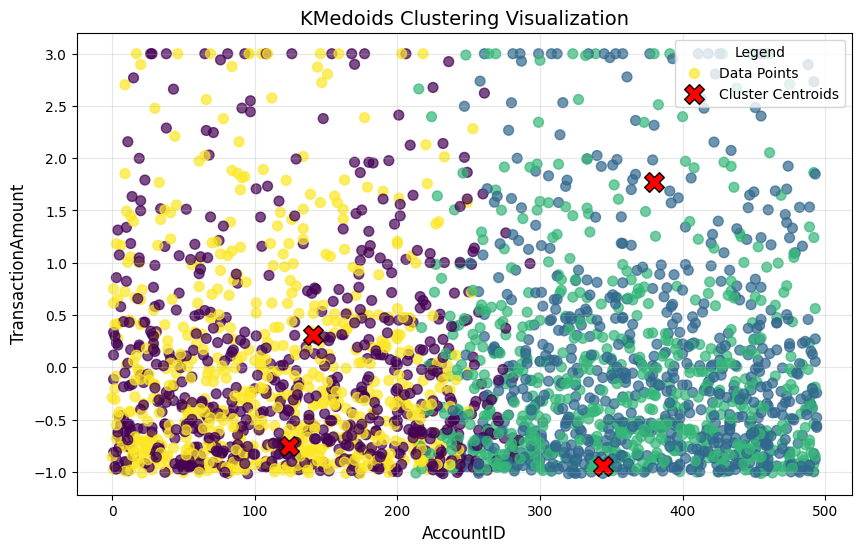

In [42]:
plt.figure(figsize=(10, 6))
plt.scatter(df_numeric_scaled.iloc[:, 0], df_numeric_scaled.iloc[:, 1], c=kmedoid_labels, cmap='viridis', s=50, alpha=0.7, label='Data Points')
plt.scatter(kmedoid_centers[:, 0], kmedoid_centers[:, 1], marker='X', s=200, c='red', label='Cluster Centroids', edgecolors='black')

plt.title('KMedoids Clustering Visualization', fontsize=14)
plt.xlabel(df_numeric_scaled.columns[0], fontsize=12)
plt.ylabel(df_numeric_scaled.columns[1], fontsize=12)
plt.legend(title='Legend', fontsize=10)
plt.grid(alpha=0.3)
plt.show()

### Concolusion
- The KMedoids algorithm successfully grouped the dataset into four distinct clusters of nearly equal size, with clusters capturing differences based on `DeviceID` and `TransactionAmount`.
- The moderate silhouette score suggests some overlap or ambiguity in cluster boundaries, which could be explored further with hyperparameter tuning or alternative features.
- This clustering provides insights into the behavioral patterns and relationships within the data, enabling targeted segmentation for deeper analysis.

## DBSCAN

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is a clustering algorithm that groups data points based on their density in the feature space. Unlike centroid-based methods like KMeans, DBSCAN does not require the number of clusters to be specified beforehand. Instead, it identifies clusters as regions of high density separated by regions of low density. Two key parameters govern DBSCAN:
- **`eps`**: The maximum distance between two points for them to be considered neighbors.
- **`min_samples`**: The minimum number of points required to form a dense region (cluster).
DBSCAN is particularly effective for discovering clusters of arbitrary shapes and identifying outliers (noise points) in datasets with varying density levels.


In [46]:
from sklearn.cluster import DBSCAN

### K-Distance Plot
   - The K-distance plot is used to determine an appropriate value for `eps`. A slight "elbow" around 36 is identified, suggesting a reasonable choice for the maximum neighborhood distance.

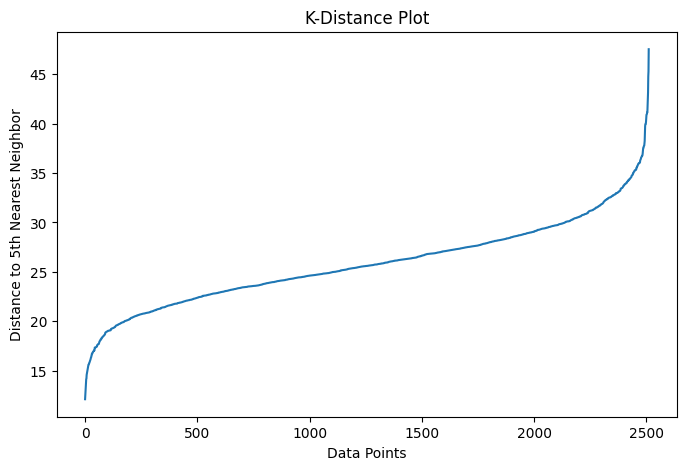

In [47]:
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(df_numeric_scaled)
distances, indices = neighbors_fit.kneighbors(df_numeric_scaled)

distances = np.sort(distances[:, 4])
plt.figure(figsize=(8, 5))
plt.plot(distances)
plt.title('K-Distance Plot')
plt.xlabel('Data Points')
plt.ylabel('Distance to 5th Nearest Neighbor')
plt.show()


### Clustering Plot
 - A scatter plot of `AccountID` vs. `TransactionAmount` shows the identified cluster (in yellow) and two noise points. Since only one cluster was formed, the visualization indicates minimal density-based variation in the data.

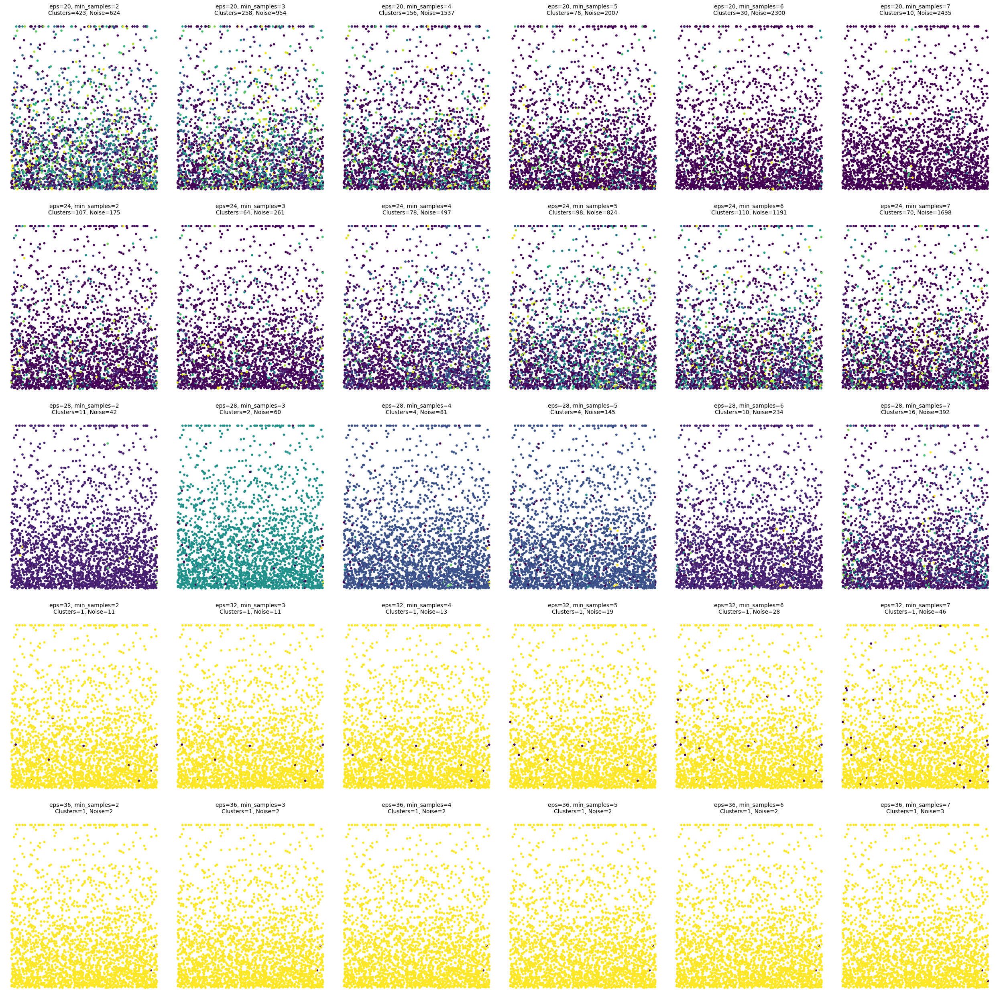

In [48]:
eps_values = np.arange(20, 40, 4)
min_samples_values = range(2, 8)

fig, axs = plt.subplots(len(eps_values), len(min_samples_values), figsize=(25, 25))

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan.fit(df_numeric_scaled)
        labels = dbscan.labels_
        n_clusters_dbscan = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise_dbscan = list(labels).count(-1)

        axs[i, j].scatter(df_numeric_scaled.iloc[:, 0], df_numeric_scaled.iloc[:, 1], c=labels, cmap='viridis', s=10)
        axs[i, j].set_title(f'eps={eps}, min_samples={min_samples}\nClusters={n_clusters_dbscan}, Noise={n_noise_dbscan}', fontsize=10)
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()

### Performance Metric
The DBSCAN (Density-Based Spatial Clustering of Applications with Noise) algorithm is applied to the bank transactions dataset to identify clusters based on density.

The parameters `eps=36` and `min_samples=2` are used, where `eps` defines the maximum distance for two points to be considered neighbors, and `min_samples` specifies the minimum number of points required to form a dense region.

Unlike centroid-based methods like KMeans, DBSCAN does not require specifying the number of clusters beforehand. It identifies dense regions as clusters and marks points in low-density regions as noise.

The clustering result shows `1 cluster` and `2 noise points`, meaning that most of the data was grouped into one large cluster, with only two points identified as outliers.

The silhouette score for this clustering is 0.169, indicating very weak cluster separation. This suggests that the data lacks distinct density-based clusters, which could be due to the uniform distribution of features.

In [49]:
min_samples = 2
eps = 36
n_clusters_dbs = 1
noise_dbs = 2
dbs = DBSCAN(min_samples=min_samples, eps=eps)

dbs.fit(df_numeric_scaled)
dbs_labels = dbs.labels_


In [50]:
silhouette_score_dbs = silhouette_score(df_numeric_scaled, dbs_labels)

print(f'The Silhouette Score for DBSCAN with eps={eps} and min_samples={min_samples} is: {silhouette_score_dbs:.3f}')

The Silhouette Score for DBSCAN with eps=36 and min_samples=2 is: 0.169


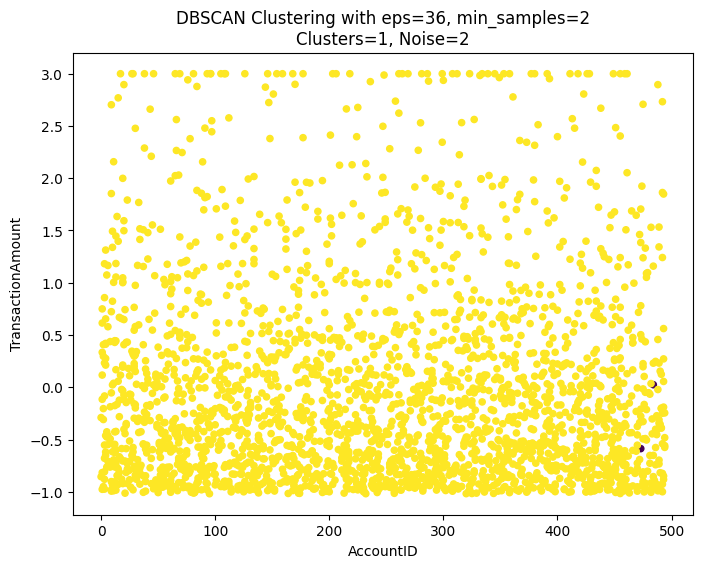

In [52]:
plt.figure(figsize=(8, 6))
plt.scatter(df_numeric_scaled.iloc[:, 0], df_numeric_scaled.iloc[:, 1], c=dbs_labels, cmap='viridis', s=20)
plt.title(f"DBSCAN Clustering with eps={eps}, min_samples={min_samples}\nClusters={n_clusters_dbs}, Noise={noise_dbs}")
plt.xlabel(df_numeric_scaled.columns[0])
plt.ylabel(df_numeric_scaled.columns[1])
plt.show()


### Conclusion
- The results reveal that the data does not form distinct density-based clusters with the given parameter settings, as almost all points were grouped into a single cluster. This may indicate that the dataset is either highly uniform or that `eps` and `min_samples` need further tuning to capture meaningful structures.
- The low silhouette score of 0.16 suggests that points within the identified cluster are not well-differentiated, leading to weak clustering performance.
- Further analysis, such as testing different values of `eps` and `min_samples` or preprocessing the data to highlight density differences, could improve the results.
- The DBSCAN approach remains valuable for identifying noise points, which can be outliers or anomalies within the data.


## Mean Shift

Mean Shift is a clustering algorithm that iteratively shifts data points towards regions of higher density, defined by a kernel function. It does not require specifying the number of clusters beforehand and instead identifies clusters as peaks in the data's probability density function.

A critical parameter in Mean Shift is the **bandwidth**, which defines the radius of the kernel and influences the granularity of the clusters. It is particularly useful for discovering arbitrarily shaped clusters and analyzing datasets with unknown cluster counts.

In [54]:
from sklearn.cluster import MeanShift, estimate_bandwidth

### Bandwidth Parameter
The bandwidth parameter is estimated using the `estimate_bandwidth` function with a `quantile=0.3`. The optimal bandwidth is calculated to be **226.30**, which reflects the range within which the algorithm identifies high-density regions for clustering.

In [55]:
bandwidth = estimate_bandwidth(df_numeric_scaled, quantile=0.3)
print(f'Optimal Bandwidth: {bandwidth:.2f}')

Optimal Bandwidth: 226.30


In [56]:
ms = MeanShift(bandwidth=bandwidth)
ms.fit(df_numeric_scaled)
ms_labels = ms.predict(df_numeric_scaled)
ms_cluster_centers = ms.cluster_centers_

In [57]:
def compute_inertia(df, labels, centers):
    inertia = 0
    for i, label in enumerate(labels):
        center = centers[label]
        point = df.iloc[i, :]
        inertia += np.sum((point - center) ** 2)
    return inertia

### Performace metrics
Using the bandwidth, the Mean Shift algorithm is grouped the data into 2 clusters.

The clustering performance is evaluated using inertia and silhouette score:
- **Inertia**: **87,264,181.755**, which measures the sum of squared distances of samples to their nearest cluster center. This value reflects the compactness of clusters, with lower values indicating tighter clustering.
- **Silhouette Score**: **0.411**, which evaluates how similar a point is to its own cluster compared to other clusters. A score of 0.411 suggests moderate separation and cohesion among clusters. This moderate silhouette score indicates some overlap or proximity between clusters but overall reasonable separation.
     

In [58]:
ms_inert = compute_inertia(df_numeric_scaled, ms_labels, ms_cluster_centers)
silhouette_score_ms = silhouette_score(df_numeric_scaled, ms_labels)
n_clusters = len(np.unique(ms_labels))

print(f'Number of Clusters: {n_clusters}')
print(f'The Inertia for Mean Shift is: {ms_inert:.3f}')
print(f'The Silhouette Score for Mean Shift is: {silhouette_score_ms:.3f}')

Number of Clusters: 2
The Inertia for Mean Shift is: 87264181.755
The Silhouette Score for Mean Shift is: 0.411


### Clusters
This distribution indicates a relatively balanced split of the data points between the clusters.
- **Cluster 0**: 1,240 samples
- **Cluster 1**: 1,272 samples.  


In [59]:
cluster_sizes = np.unique(ms_labels, return_counts=True)
for cluster, size in zip(cluster_sizes[0], cluster_sizes[1]):
    print(f'Cluster {cluster}: {size} samples')

Cluster 0: 1240 samples
Cluster 1: 1272 samples


### Cluster Visualization
   - The scatter plot of `AccountID` vs. `TransactionAmount` shows the two clusters, each represented by distinct colors (yellow and purple).
   - The **<font color='red'>X</font>** markers indicate the centers of the clusters identified by the Mean Shift algorithm.


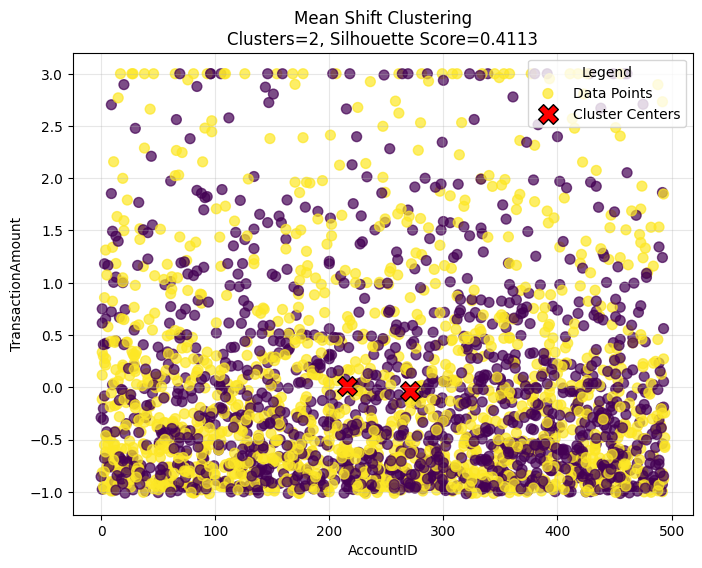

In [60]:
plt.figure(figsize=(8, 6))
plt.scatter(df_numeric_scaled.iloc[:, 0], df_numeric_scaled.iloc[:, 1], c=ms_labels, cmap='viridis', s=50, alpha=0.7, label='Data Points')
plt.scatter(ms_cluster_centers[:, 0], ms_cluster_centers[:, 1], marker='X', s=200, c='red', label='Cluster Centers', edgecolors='black')
plt.title(f'Mean Shift Clustering\nClusters={n_clusters}, Silhouette Score={silhouette_score_ms:.4f}')
plt.xlabel(df_numeric_scaled.columns[0])
plt.ylabel(df_numeric_scaled.columns[1])
plt.legend(title='Legend')
plt.grid(alpha=0.3)
plt.show()


### Conclusion
- The algorithm successfully identified two clusters, which suggests that the dataset has two primary density regions. This could reflect underlying patterns or behaviors in the transaction data.
- The almost equal sizes of the clusters indicate a balanced segmentation, which is useful for applications like customer profiling or behavior analysis.
- While the inertia value indicates that the data points are relatively well-clustered around the identified centers, the moderate silhouette score highlights some overlap or ambiguity between the clusters.
- The chosen bandwidth (226.30) influences the scale at which density peaks are detected. Adjusting this value could reveal more granular or broader clusters, depending on the desired analysis depth.

## Hierarchical Clustering

Hierarchical Clustering is a clustering method that builds a hierarchy of clusters in a tree-like structure called a **dendrogram**. There are two main types:

- **Agglomerative Clustering (Bottom-Up):** Starts with each data point as its own cluster and iteratively merges the closest clusters until a single cluster forms.

- **Divisive Clustering (Top-Down):** Starts with all data points in one cluster and recursively splits them into smaller clusters.

### Key Parameters in Hierarchical Clustering:
- **Linkage Methods:**
  - `single`: Uses the minimum distance between clusters.
  - `complete`: Uses the maximum distance between clusters.
  - `average`: Uses the average distance between clusters.
  - `ward`: Minimizes the variance between clusters.

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, silhouette_samples

In [ ]:
def plot_dendrogram(df, methods):
    linkage_matrices = {method: linkage(df, method=method) for method in methods}
    plt.figure(figsize=(12, 6))
    for i, method in enumerate(methods):
        plt.subplot(2, 2, i + 1)
        dendrogram(linkage_matrices[method])
        plt.title(f"Dendrogram ({method.capitalize()})")
    plt.tight_layout()
    plt.show()

In [ ]:
def calculate_silhouette_scores(df, methods, n_clusters=3):
    scores = {}
    for method in methods:
        clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage=method)
        labels = clustering.fit_predict(df)
        score = silhouette_score(df, labels)
        scores[method] = score
    return scores

In [ ]:
def plot_silhouette(df, labels):
    silhouette_vals = silhouette_samples(df, labels)
    avg_silhouette = [np.mean(silhouette_vals[labels == cluster]) for cluster in np.unique(labels)]
    clusters = np.unique(labels)
    plt.bar(clusters, avg_silhouette, alpha=0.7, color=plt.cm.tab10(range(len(clusters))))

    for i, score in enumerate(avg_silhouette):
        plt.text(clusters[i], score + 0.01, f"{clusters[i]}", ha="center", fontsize=10)

    plt.axhline(y=np.mean(silhouette_vals), color="red", linestyle="--", label="Overall Average")
    plt.xlabel("Cluster")
    plt.ylabel("Average Silhouette Score")
    plt.title("Silhouette Scores by Cluster")
    plt.legend()
    plt.show()

### Dendogram
Dendrogram shows how data points are merged at each step of the clustering process.
- Each linkage method (single, complete, average, ward) produces a different dendrogram structure.
- The height of the vertical lines indicates the distance or dissimilarity at which clusters are merged.

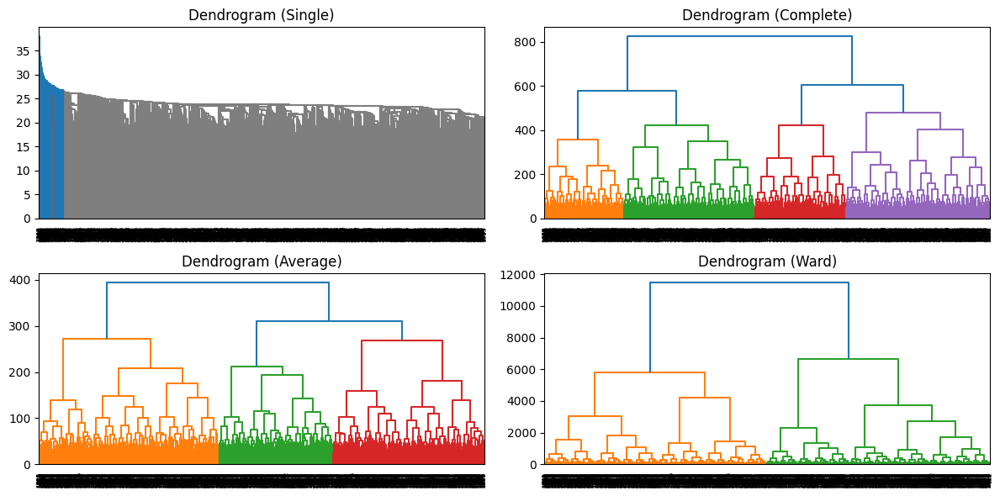

In [ ]:
methods = ['single', 'complete', 'average', 'ward']

plot_dendrogram(df_numeric_scaled, methods)

###Observation from Dendrograms:
- `Single` linkage results in a chain-like merging structure, often prone to creating elongated clusters.
- `Complete`, `Average`, and `Ward` linkages show more compact cluster formations, with Ward focusing on minimizing variance.

###Silhouette Score: Measures cluster quality, ranging from -1 to 1:
- A score close to 1 indicates well-separated clusters.
- A score near 0 indicates overlapping clusters.
- Negative scores suggest poor clustering.

In [ ]:
n_clusters = 3
silhouette_scores = calculate_silhouette_scores(df_numeric_scaled, methods, n_clusters)

print("Silhouette Scores for different linkage methods:")
for method, score in silhouette_scores.items():
    print(f"{method.capitalize()}: {score:.3f}")

Silhouette Scores for different linkage methods:
Single: -0.112
Complete: 0.357
Average: 0.344
Ward: 0.342


### Silhouette Scores Observation:
The Complete linkage method achieved the highest silhouette score (0.357), indicating better-defined clusters compared to other methods.

###Silhouette Scores Visulization:
- The bar plot displays the average silhouette score for each cluster.
- The dashed red line represents the overall average silhouette score.
- Cluster 2 has the highest silhouette score, contributing most to the overall quality of clustering.

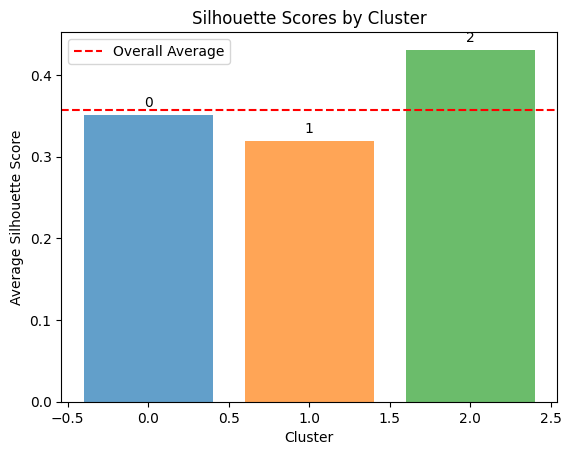

In [ ]:
plot_silhouette(df_numeric_scaled, labels)

###Observation from Plot:
- Cluster 2 is the most well-defined, while clusters 0 and 1 are less compact but still contribute positively to the overall clustering quality.

###Agglomerative Clustering Process
In this step, we apply the `Complete Linkage` method for hierarchical clustering. Below is the breakdown of the process:

####Why Complete Linkage?
- From the silhouette score analysis of various linkage methods (`single`, `complete`, `average`, `ward`), `Complete Linkage` provided the highest silhouette score (0.357).
- This indicates that the clusters formed using this method are better defined and more compact compared to other methods.


In [ ]:
selected_method = 'complete'
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage=selected_method)
labels = agg_clustering.fit_predict(df_numeric_scaled)

In [ ]:
silhouette_score_hl = silhouette_score(df_numeric_scaled, labels)
print(f"Silhouette Score for {selected_method.capitalize()} linkage: {silhouette_score_hl:.3f}")

Silhouette Score for Complete linkage: 0.357


###Conclusion
- The Complete Linkage method was selected as the optimal clustering approach due to its higher silhouette score compared to other methods.
- With n_clusters = 3, the data is grouped into three well-defined clusters, demonstrating the effectiveness of the Complete Linkage strategy.

## Fuzzy C-Means

Fuzzy C-Means (FCM) is a clustering algorithm that allows data points to belong to multiple clusters with varying degrees of membership, unlike hard clustering methods (e.g., k-means) where each data point belongs to exactly one cluster.

### Key Features:
- Each data point has a membership score for every cluster (values range from 0 to 1).
- The algorithm minimizes the weighted distance between data points and cluster centers, with weights determined by membership degrees.
- Controlled by the `fuzziness parameter (m)`:
  - `m > 1`: Higher values increase overlap between clusters (more "fuzzy").
  - `m = 1`: No fuzziness, equivalent to hard clustering.

In [ ]:
!pip install scikit-fuzzy

In [ ]:
import skfuzzy as fuzz

###Hyperparameter Grid Search
Manual grid search evaluetates and finds the best hyperparameters for the `Fuzzy` model.
    
- `c`: Number of clusters.
- `m`: Fuzziness parameter.
- `error`: Convergence threshold.
- `maxiter`: Maximum iterations.

In [ ]:
def fuzzy_best_param(df, cluster_options, fuzziness_options, error_options, maxiter_options):

    results = []

    for c in cluster_options:
        for m in fuzziness_options:
            for error in error_options:
                for max_iter in maxiter_options:
                    try:
                        cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
                            df.T, c=c, m=m, error=error, maxiter=max_iter, init=None
                        )

                        cluster_assignments = np.argmax(u, axis=0)

                        silhouette_avg = silhouette_score(df, cluster_assignments)

                        # Save results
                        results.append({
                            "n_clusters": c,
                            "fuzziness": m,
                            "error": error,
                            "maxiter": max_iter,
                            "silhouette_score": silhouette_avg
                        })

                    except Exception as e:
                        # Handle errors (e.g., non-convergence)
                        print(f"Error for c={c}, m={m}, error={error}, maxiter={max_iter}: {e}")
                        continue

    results_df = pd.DataFrame(results)

    top_results = results_df.sort_values(by="silhouette_score", ascending=False).head(5)

    return results_df, top_results

In [ ]:
cluster_options = [2, 3]
fuzziness_options = [1.3, 1.7, 2]
error_options = [0.001, 0.005]
maxiter_options = [50, 500, 1000]

results_df, top_results = fuzzy_best_param(df_numeric_scaled, cluster_options, fuzziness_options, error_options, maxiter_options)

In [ ]:
print(top_results)

   n_clusters  fuzziness  error  maxiter  silhouette_score
0           2        1.3  0.001       50          0.418267
2           2        1.3  0.001     1000          0.418267
3           2        1.3  0.005       50          0.418267
4           2        1.3  0.005      500          0.418267
5           2        1.3  0.005     1000          0.418267


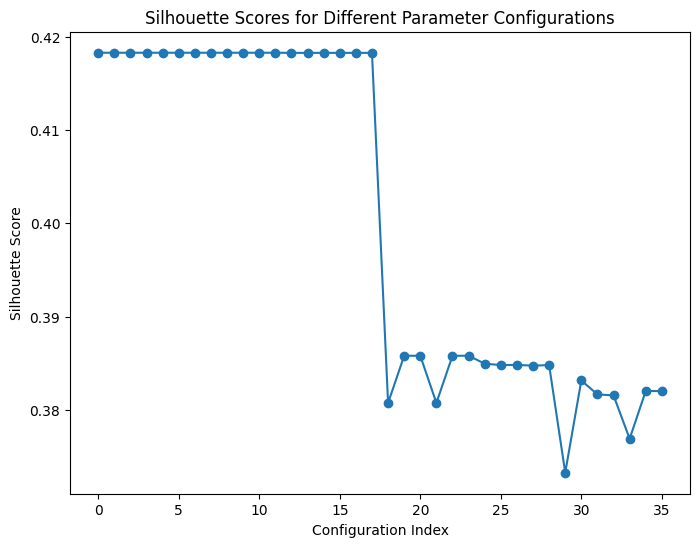

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(results_df["silhouette_score"], marker="o")
plt.title("Silhouette Scores for Different Parameter Configurations")
plt.xlabel("Configuration Index")
plt.ylabel("Silhouette Score")
plt.show()

###Fuzzy C-Means Clustering
   - The code applied the FCM algorithm on the dataset with the following parameters dervied from the grid search above:
     - `c=2`: Number of clusters.
     - `m=1.3, 1.5, ...`: Fuzziness parameter.
     - `error=0.001, 0.005`: Convergence threshold.
     - `maxiter=500, 1000, 1500`: Maximum iterations.
   - The algorithm outputs:
     - `Cluster centers`: Centroids of each cluster.
     - `Membership matrix (u)`: Membership strength of each point for each cluster.

In [ ]:
c = 2
m = 1.3
error = 0.001
max_iter = 500

cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(df_numeric_scaled.T, c=c, m=m, error=error, maxiter=max_iter, init=None)

cluster_assignments = np.argmax(u, axis=0)

fuzzy_centers = cntr

###Visualizations
**Scatter Plot**:
   - Cluster centers are marked as red `X`.
   - Displays data points colored by their cluster assignments with cluster centers marked as red `X`.


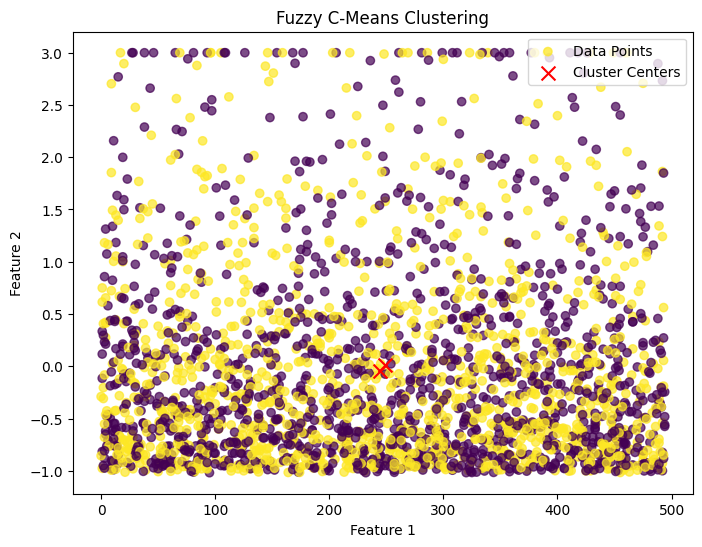

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(df_numeric_scaled.iloc[:, 0], df_numeric_scaled.iloc[:, 1], c=cluster_assignments, cmap='viridis', alpha=0.7, label='Data Points')
plt.scatter(fuzzy_centers[:, 0], fuzzy_centers[:, 1], color='red', marker='x', s=100, label='Cluster Centers')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Fuzzy C-Means Clustering')
plt.legend()
plt.show()

 **Membership Strength Plots**:

 Shows the "fuzziness" by visualizing the membership strength of data points for each cluster.
   - Visualize how strongly each point belongs to a specific cluster.
   - Higher membership strength values indicate better-defined clusters.


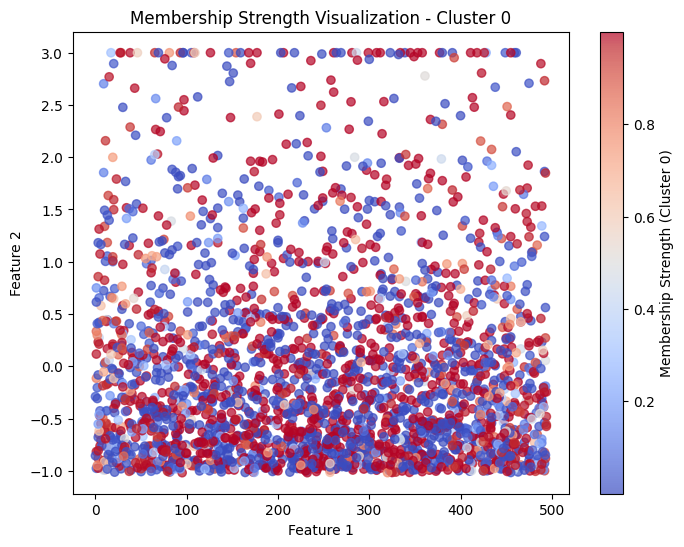

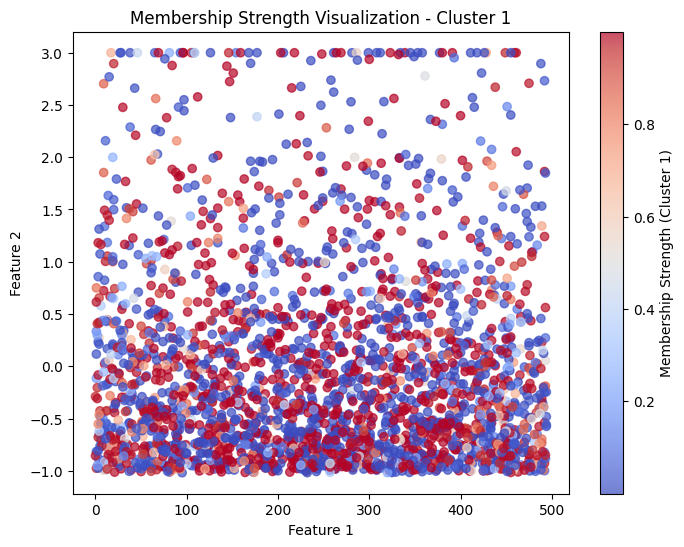

In [ ]:
for i in range(c):
    plt.figure(figsize=(8, 6))
    plt.scatter(df_numeric_scaled.iloc[:, 0], df_numeric_scaled.iloc[:, 1], c=u[i], cmap='coolwarm', alpha=0.7)
    plt.colorbar(label=f'Membership Strength (Cluster {i})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title(f'Membership Strength Visualization - Cluster {i}')
    plt.show()

###Cluster Quality Evaluation:
The Silhouette Score is calculated:
- **Overall Silhouette Score**: Measures the quality of clustering (higher is better, max = 1).
- **Per-Cluster Silhouette Score**: Average score for each cluster to understand individual cluster cohesion.


In [ ]:
silhouette_score_fms = silhouette_score(df_numeric_scaled, cluster_assignments)
silhouette_per_cluster = silhouette_samples(df_numeric_scaled, cluster_assignments)

print(f'Overall Silhouette Score for Fuzzy C-Means: {silhouette_score_fms:.3f}')
for cluster in range(c):
    cluster_silhouette = np.mean(silhouette_per_cluster[cluster_assignments == cluster])
    print(f'Average Silhouette Score for Cluster {cluster}: {cluster_silhouette:.3f}')

Overall Silhouette Score for Fuzzy C-Means: 0.418
Average Silhouette Score for Cluster 0: 0.417
Average Silhouette Score for Cluster 1: 0.420


### Conclusion
- Fuzzy C-Means successfully clustered the data into two moderately well-separated clusters with overlap, as indicated by the silhouette scores.
- The `fuzziness parameter (`m=1.3`)` provided the best balance between clear cluster boundaries and overlap.
- Membership strength plots reveal which points are ambiguously assigned, offering valuable insights into data structure.

# **Insights and Conclusion: Clustering Algorithms Performance**

In [ ]:
alg_list = ['KMeans', 'K-Medoid', 'DBSCAN', 'Mean Shift', 'Hierarchical Clustering', 'Fuzzy C-Means']
sil_list = [silhouette_score_kmn, silhouette_score_kmed, silhouette_score_dbs, silhouette_score_ms, silhouette_score_hl, silhouette_score_fms]

data = np.array([alg_list, sil_list]).T

sil_df = pd.DataFrame(data, columns=['Algorithm', 'Silhouette_Score'])
sil_df['Silhouette_Score'] = sil_df['Silhouette_Score'].astype(float)

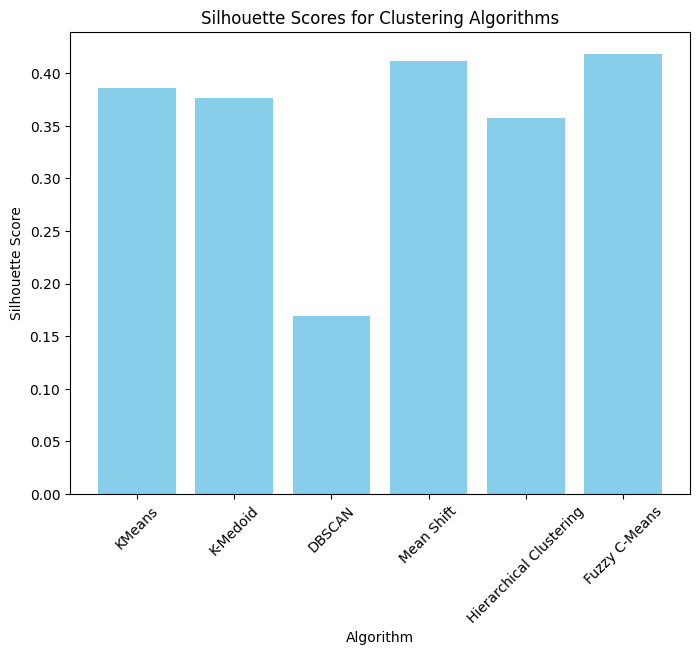

In [ ]:
plt.figure(figsize=(8, 6))
plt.bar(sil_df['Algorithm'], sil_df['Silhouette_Score'], color='skyblue')
plt.xlabel('Algorithm')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Clustering Algorithms')
plt.xticks(rotation=45)
plt.show()

The Silhouette Score comparison for various clustering algorithms reveals the effectiveness of each method in grouping the dataset into distinct clusters:

- **Fuzzy C-Means** achieved the highest silhouette score, indicating it provides the best cluster cohesion and separation for this dataset. This suggests that the data's underlying structure benefits from the soft clustering approach, where data points can belong to multiple clusters with varying degrees of membership.

- **Mean Shift** also performed well, achieving a silhouette score close to Fuzzy C-Means. This demonstrates that density-based clustering with an automatically determined number of clusters is effective for this dataset.

- **KMeans** and **KMedoid** showed moderate performance, with comparable silhouette scores slightly below Mean Shift and Fuzzy C-Means. This indicates that centroid- and medoid-based clustering methods can form reasonably well-separated clusters but might struggle with edge cases in the data.

- **Hierarchical Clustering** performed similarly to KMeans, showing moderate results, likely due to its flexibility in forming hierarchical cluster structures.

- **DBSCAN**, on the other hand, had the lowest silhouette score. This reflects its limited ability to capture meaningful cluster structures in the dataset, possibly due to suboptimal parameter settings or a lack of well-defined density variations in the data.

The dataset shows its best clustering potential with Fuzzy C-Means and Mean Shift, highlighting that methods capable of capturing soft clustering or density-based patterns are better suited for the data. While centroid-based methods like KMeans and KMedoid offer reasonable performance, DBSCAN struggles due to low density variations. These insights can guide the choice of clustering algorithms for similar datasets, emphasizing the importance of matching the algorithm to the data's structure.
